### ECOMMERCE ANALYTICS, RETURN RATES, AND CHURN PREDICTION

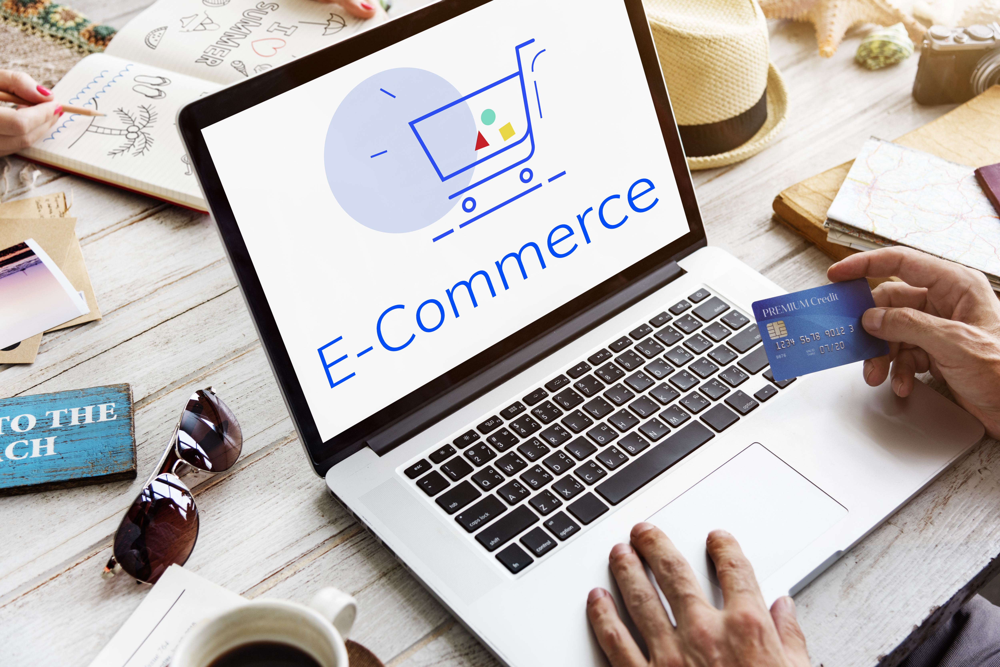

## PURPOSE OF DATASET:
The purpose of this dataset is to analyze customer behavior patterns, purchasing trends, and churn tendencies in an e-commerce environment. By exploring customer demographics, purchasing habits, and engagement metrics, we aim to uncover key insights that can inform strategic decisions for customer retention and business growth.



### PROBLEM STATEMENT

Customer churn poses a significant challenge for e-commerce businesses, impacting profitability and long-term growth. Understanding customer behavior, including purchasing patterns, return tendencies, and payment preferences, is essential for building lasting customer relationships. At the same time, return rates, product performance, and demographic factors play critical roles in shaping overall business strategy. A lack of insight into these areas can lead to ineffective marketing, poor inventory planning, and missed opportunities for customer engagement.


### OBJECTIVES
1. Increase customer retention by understanding churn patterns
   
-	What is the churn rate among customers?

-	Are there specific age groups or genders more likely to churn?

-	How does churn relate to payment method?

2. Identify high-value customers to target with loyalty programs
-	What are the buying patterns of high-value customers

3. Understand product category performance to inform inventory and marketing strategies
-	What is the return rate per product category?

-	Which categories are most popular among different age groups?

4. Optimize sales strategies based on customer demographics and payment preferences
-	How does gender or age influence product preferences and payment choices?

-	Is there any trend in purchase behavior over time (e.g., seasonal spikes)?

5. Reduce return rates by identifying contributing factors
-	What is the overall return rate?

-	Are returns associated with specific product categories or age groups?


In [137]:
# Import libraries
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [138]:
#Load the Dataset
data = pd.read_csv("ecommerce_customer_data.csv")

In [139]:
#Check the first five rows
data.head()

,Customer ID,Purchase Date,Product Category,Product Price,Quantity,Total Purchase Amount,Payment Method,Customer Age,Returns,Customer Name,Age,Gender,Churn
0,46251,2020-09-08 09:38:32,Electronics,12,3,740,Credit Card,37,0.0,Christine Hernandez,37,Male,0
1,46251,2022-03-05 12:56:35,Home,468,4,2739,PayPal,37,0.0,Christine Hernandez,37,Male,0
2,46251,2022-05-23 18:18:01,Home,288,2,3196,PayPal,37,0.0,Christine Hernandez,37,Male,0
3,46251,2020-11-12 13:13:29,Clothing,196,1,3509,PayPal,37,0.0,Christine Hernandez,37,Male,0
4,13593,2020-11-27 17:55:11,Home,449,1,3452,Credit Card,49,0.0,James Grant,49,Female,1


In [140]:
#Check the first five rows
data.tail()

,Customer ID,Purchase Date,Product Category,Product Price,Quantity,Total Purchase Amount,Payment Method,Customer Age,Returns,Customer Name,Age,Gender,Churn
249995,33308,2023-08-10 13:39:06,Clothing,279,2,2187,PayPal,55,1.0,Michelle Flores,55,Male,1
249996,48835,2021-11-23 01:30:42,Home,27,1,3615,Credit Card,42,1.0,Jeremy Rush,42,Female,1
249997,21019,2020-07-02 14:04:48,Home,17,5,2466,Cash,41,0.0,Tina Craig,41,Male,0
249998,49234,2020-12-30 02:02:40,Books,398,2,3668,Crypto,34,0.0,Jennifer Cooper,34,Female,1
249999,16971,2021-03-13 16:28:35,Electronics,425,4,2370,Cash,36,1.0,Justin Lawson,36,Female,1


In [141]:
#Check the shape of the dataset
data.shape

(250000, 13)

In [142]:
#Columns of the dataset
data.columns

Index(['Customer ID', 'Purchase Date', 'Product Category', 'Product Price',
       'Quantity', 'Total Purchase Amount', 'Payment Method', 'Customer Age',
       'Returns', 'Customer Name', 'Age', 'Gender', 'Churn'],
      dtype='object')

In [143]:
#Brief info on the dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 250000 entries, 0 to 249999
Data columns (total 13 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Customer ID            250000 non-null  int64  
 1   Purchase Date          250000 non-null  object 
 2   Product Category       250000 non-null  object 
 3   Product Price          250000 non-null  int64  
 4   Quantity               250000 non-null  int64  
 5   Total Purchase Amount  250000 non-null  int64  
 6   Payment Method         250000 non-null  object 
 7   Customer Age           250000 non-null  int64  
 8   Returns                202404 non-null  float64
 9   Customer Name          250000 non-null  object 
 10  Age                    250000 non-null  int64  
 11  Gender                 250000 non-null  object 
 12  Churn                  250000 non-null  int64  
dtypes: float64(1), int64(7), object(5)
memory usage: 24.8+ MB


In [144]:
# checking for missing values
data.isna().sum()

Customer ID                  0
Purchase Date                0
Product Category             0
Product Price                0
Quantity                     0
Total Purchase Amount        0
Payment Method               0
Customer Age                 0
Returns                  47596
Customer Name                0
Age                          0
Gender                       0
Churn                        0
dtype: int64

In [145]:
# summarizing data statistics
data.describe()

,Customer ID,Product Price,Quantity,Total Purchase Amount,Customer Age,Returns,Age,Churn
count,250000.00000,250000.000000,250000.000000,250000.000000,250000.000000,202404.000000,250000.000000,250000.000000
mean,25004.03624,254.659512,2.998896,2725.370732,43.940528,0.497861,43.940528,0.199496
std,14428.27959,141.568577,1.414694,1442.933565,15.350246,0.499997,15.350246,0.399622
min,1.00000,10.000000,1.000000,100.000000,18.000000,0.000000,18.000000,0.000000
25%,12497.75000,132.000000,2.000000,1477.000000,31.000000,0.000000,31.000000,0.000000
50%,25018.00000,255.000000,3.000000,2724.000000,44.000000,0.000000,44.000000,0.000000
75%,37506.00000,377.000000,4.000000,3974.000000,57.000000,1.000000,57.000000,0.000000
max,50000.00000,500.000000,5.000000,5350.000000,70.000000,1.000000,70.000000,1.000000


### Cleaning the Dataset

In [146]:
# filling missing numbers
data['Returns']=data['Returns'].fillna(0)

In [147]:
# rechecking if there are missing values
data.isna().sum()

Customer ID              0
Purchase Date            0
Product Category         0
Product Price            0
Quantity                 0
Total Purchase Amount    0
Payment Method           0
Customer Age             0
Returns                  0
Customer Name            0
Age                      0
Gender                   0
Churn                    0
dtype: int64

In [148]:
#Check for number of  duplicate entries
data.duplicated().sum()

0

In [149]:
#check the shape of the dataset
data.shape

(250000, 13)

In [150]:
#Data type of each columns
data.dtypes

Customer ID                int64
Purchase Date             object
Product Category          object
Product Price              int64
Quantity                   int64
Total Purchase Amount      int64
Payment Method            object
Customer Age               int64
Returns                  float64
Customer Name             object
Age                        int64
Gender                    object
Churn                      int64
dtype: object

In [151]:
# Rechecking for first five rows
data.head()

,Customer ID,Purchase Date,Product Category,Product Price,Quantity,Total Purchase Amount,Payment Method,Customer Age,Returns,Customer Name,Age,Gender,Churn
0,46251,2020-09-08 09:38:32,Electronics,12,3,740,Credit Card,37,0.0,Christine Hernandez,37,Male,0
1,46251,2022-03-05 12:56:35,Home,468,4,2739,PayPal,37,0.0,Christine Hernandez,37,Male,0
2,46251,2022-05-23 18:18:01,Home,288,2,3196,PayPal,37,0.0,Christine Hernandez,37,Male,0
3,46251,2020-11-12 13:13:29,Clothing,196,1,3509,PayPal,37,0.0,Christine Hernandez,37,Male,0
4,13593,2020-11-27 17:55:11,Home,449,1,3452,Credit Card,49,0.0,James Grant,49,Female,1


In [152]:
# First, ensure Purchase Date is in datetime format
data["Purchase Date"] = pd.to_datetime(data["Purchase Date"])

# Then strip time and keep only the date part
data["Purchase Date"] = data["Purchase Date"].dt.date

# Now continue with type conversions
data["Customer ID"] = data["Customer ID"].astype("object")
data["Product Category"] = data["Product Category"].astype("category")
data["Payment Method"] = data["Payment Method"].astype("category")
data["Returns"] = data["Returns"].astype("int")
data["Gender"] = data["Gender"].astype("category")


In [153]:
# Rechecking data types after update
data.dtypes

Customer ID                object
Purchase Date              object
Product Category         category
Product Price               int64
Quantity                    int64
Total Purchase Amount       int64
Payment Method           category
Customer Age                int64
Returns                     int32
Customer Name              object
Age                         int64
Gender                   category
Churn                       int64
dtype: object

In [154]:
# converting the data type of Purchase date
data["Purchase Date"] = pd.to_datetime(data["Purchase Date"])


In [155]:
data.dtypes

Customer ID                      object
Purchase Date            datetime64[ns]
Product Category               category
Product Price                     int64
Quantity                          int64
Total Purchase Amount             int64
Payment Method                 category
Customer Age                      int64
Returns                           int32
Customer Name                    object
Age                               int64
Gender                         category
Churn                             int64
dtype: object

In [156]:
data.head()

,Customer ID,Purchase Date,Product Category,Product Price,Quantity,Total Purchase Amount,Payment Method,Customer Age,Returns,Customer Name,Age,Gender,Churn
0,46251,2020-09-08,Electronics,12,3,740,Credit Card,37,0,Christine Hernandez,37,Male,0
1,46251,2022-03-05,Home,468,4,2739,PayPal,37,0,Christine Hernandez,37,Male,0
2,46251,2022-05-23,Home,288,2,3196,PayPal,37,0,Christine Hernandez,37,Male,0
3,46251,2020-11-12,Clothing,196,1,3509,PayPal,37,0,Christine Hernandez,37,Male,0
4,13593,2020-11-27,Home,449,1,3452,Credit Card,49,0,James Grant,49,Female,1


In [157]:
# checking unique values of gender
data['Gender'].unique()



['Male', 'Female']
Categories (2, object): ['Female', 'Male']

In [158]:
# checking unique values of Product Category
data['Product Category'].unique()


['Electronics', 'Home', 'Clothing', 'Books']
Categories (4, object): ['Books', 'Clothing', 'Electronics', 'Home']

In [159]:
# checking unique values of Product Category
data['Payment Method'].unique()

['Credit Card', 'PayPal', 'Cash', 'Crypto']
Categories (4, object): ['Cash', 'Credit Card', 'Crypto', 'PayPal']

In [160]:
# checking unique values of Returns
data['Returns'].unique()

array([0, 1])

In [161]:
# checking unique values of Returns
data['Churn'].unique()

array([0, 1], dtype=int64)

In [162]:
# checking for value counts
data["Gender"].value_counts()

Gender
Female    125560
Male      124440
Name: count, dtype: int64

In [163]:
# checking for value counts
data["Product Category"].value_counts()

Product Category
Clothing       75052
Books          74912
Electronics    50185
Home           49851
Name: count, dtype: int64

In [164]:
# checking for value counts
data["Payment Method"].value_counts()

Payment Method
Credit Card    100486
PayPal          74837
Cash            49894
Crypto          24783
Name: count, dtype: int64

In [165]:
data.head()

,Customer ID,Purchase Date,Product Category,Product Price,Quantity,Total Purchase Amount,Payment Method,Customer Age,Returns,Customer Name,Age,Gender,Churn
0,46251,2020-09-08,Electronics,12,3,740,Credit Card,37,0,Christine Hernandez,37,Male,0
1,46251,2022-03-05,Home,468,4,2739,PayPal,37,0,Christine Hernandez,37,Male,0
2,46251,2022-05-23,Home,288,2,3196,PayPal,37,0,Christine Hernandez,37,Male,0
3,46251,2020-11-12,Clothing,196,1,3509,PayPal,37,0,Christine Hernandez,37,Male,0
4,13593,2020-11-27,Home,449,1,3452,Credit Card,49,0,James Grant,49,Female,1


In [166]:
# Replace spaces with underscores in column names
data.columns = data.columns.str.replace(' ', '_')


In [167]:
data.head()

,Customer_ID,Purchase_Date,Product_Category,Product_Price,Quantity,Total_Purchase_Amount,Payment_Method,Customer_Age,Returns,Customer_Name,Age,Gender,Churn
0,46251,2020-09-08,Electronics,12,3,740,Credit Card,37,0,Christine Hernandez,37,Male,0
1,46251,2022-03-05,Home,468,4,2739,PayPal,37,0,Christine Hernandez,37,Male,0
2,46251,2022-05-23,Home,288,2,3196,PayPal,37,0,Christine Hernandez,37,Male,0
3,46251,2020-11-12,Clothing,196,1,3509,PayPal,37,0,Christine Hernandez,37,Male,0
4,13593,2020-11-27,Home,449,1,3452,Credit Card,49,0,James Grant,49,Female,1


In [168]:
# Saving to a csv
data.to_csv("ecommerce_customer_data_cleaned.csv", index=False)

### DATA VISUALIZATION

In [169]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns




In [170]:
data.head()

,Customer_ID,Purchase_Date,Product_Category,Product_Price,Quantity,Total_Purchase_Amount,Payment_Method,Customer_Age,Returns,Customer_Name,Age,Gender,Churn
0,46251,2020-09-08,Electronics,12,3,740,Credit Card,37,0,Christine Hernandez,37,Male,0
1,46251,2022-03-05,Home,468,4,2739,PayPal,37,0,Christine Hernandez,37,Male,0
2,46251,2022-05-23,Home,288,2,3196,PayPal,37,0,Christine Hernandez,37,Male,0
3,46251,2020-11-12,Clothing,196,1,3509,PayPal,37,0,Christine Hernandez,37,Male,0
4,13593,2020-11-27,Home,449,1,3452,Credit Card,49,0,James Grant,49,Female,1


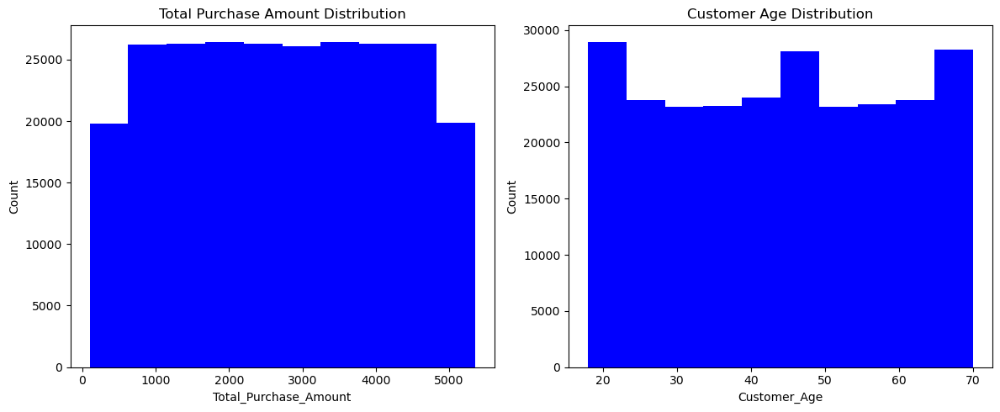

In [171]:
# Set up side-by-side subplots (1 row, 2 columns)
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  # Adjust size as needed

# Histogram for Total Purchase Amount
axes[0].hist(data["Total_Purchase_Amount"], bins=10, color="#0000FF", edgecolor=None, linewidth=0)
axes[0].set_title("Total Purchase Amount Distribution")
axes[0].set_xlabel("Total_Purchase_Amount")
axes[0].set_ylabel("Count")
axes[0].grid(False)  # Disable gridlines

# Histogram for Customer Age
axes[1].hist(data["Customer_Age"], bins=10, color="#0000FF", edgecolor=None, linewidth=0)
axes[1].set_title("Customer Age Distribution")
axes[1].set_xlabel("Customer_Age")
axes[1].set_ylabel("Count")
axes[1].grid(False)  # Disable gridlines

plt.tight_layout()
plt.show()




### Checking for outliers

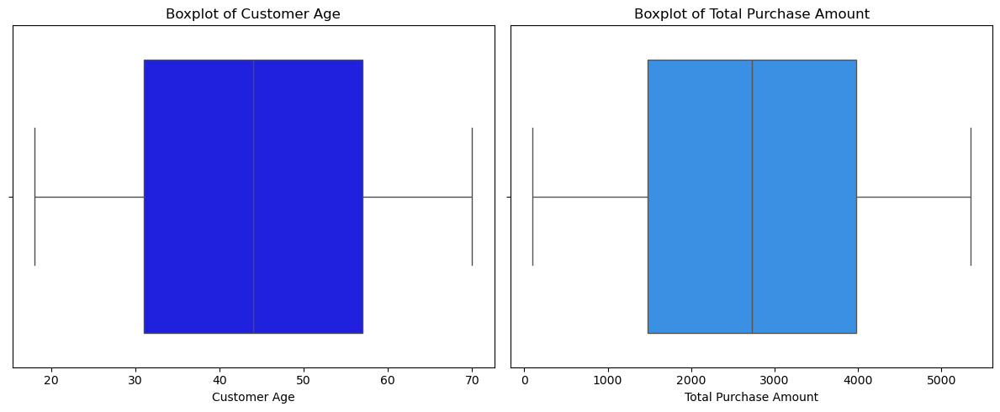

In [172]:
# Set up subplots: 1 row, 2 columns
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Boxplot for Customer Age
sns.boxplot(x=data['Customer_Age'], ax=axes[0], color='#0000FF')
axes[0].set_title('Boxplot of Customer Age')
axes[0].set_xlabel('Customer Age')

# Boxplot for Total Purchase Amount
sns.boxplot(x=data['Total_Purchase_Amount'], ax=axes[1], color='#1E90FF')
axes[1].set_title('Boxplot of Total Purchase Amount')
axes[1].set_xlabel('Total Purchase Amount')

plt.tight_layout()
plt.show()


## Objective 1: Increase customer retention by understanding churn patterns

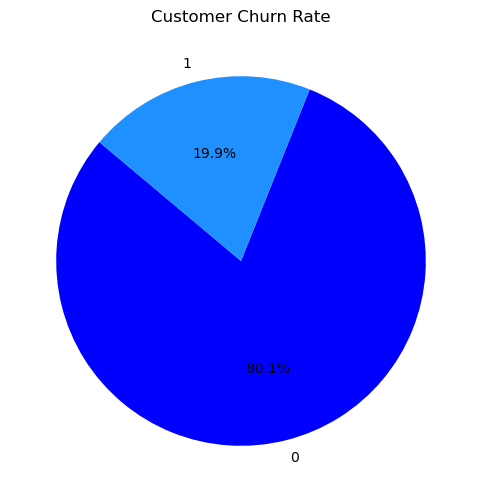

In [173]:
import matplotlib.pyplot as plt

# Churn rate calculation
churn_rate = data['Churn'].value_counts(normalize=True) * 100

# Create pie chart
plt.figure(figsize=(8, 6))
plt.pie(churn_rate, labels=churn_rate.index, autopct='%1.1f%%', colors=['#0000FF', '#1E90FF'], startangle=140)
plt.title('Customer Churn Rate')
plt.show()


### Findings:
Customer Churn Rate:

The chart illustrates that 80.1% of customers did not churn, highlighting a strong overall retention rate.

However, 19.9% of customers churned, which indicates room for improvement in customer satisfaction or engagement strategies.

Observation:

While the majority of customers stay loyal, addressing the nearly one-fifth churn rate is crucial for boosting long-term business performance and customer lifetime value.

### Recommendations:
Investigate Churn Causes:

Perform a deeper analysis to identify factors contributing to the 19.9% churn rate, such as product dissatisfaction, pricing concerns, or service quality issues.

Retention Strategies:

Implement initiatives like loyalty programs, personalized marketing, or enhanced customer support to better retain at-risk customers.

Continuous Monitoring:

Regularly track churn rates to evaluate the effectiveness of new strategies and make adjustments as necessary.

C:\Users\Augustina Nyarkoh\AppData\Local\Temp\ipykernel_21376\1086982558.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  gender_churn = data.groupby('Gender')['Churn'].value_counts(normalize=True).unstack()


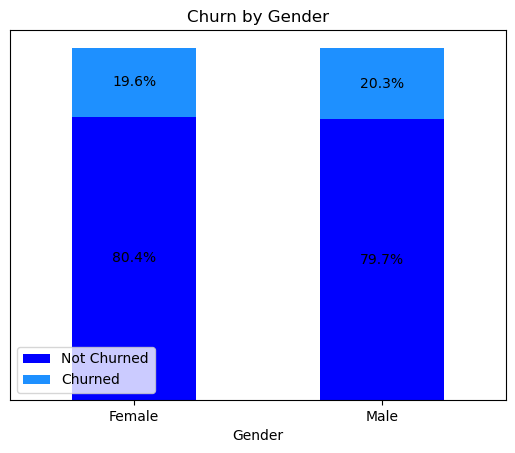

In [174]:

# Gender-based churn rates
gender_churn = data.groupby('Gender')['Churn'].value_counts(normalize=True).unstack()

# Create a stacked bar chart
ax = gender_churn.plot(kind='bar', stacked=True, color=['#0000FF', '#1E90FF'])

# Customize chart
plt.title('Churn by Gender')
plt.xlabel('Gender')
ax.yaxis.set_visible(False)  # Remove the y-axis
plt.legend(['Not Churned', 'Churned'])
plt.grid(False)  # Remove grid lines

# Straighten gender names under each bar
ax.set_xticks(range(len(gender_churn.index)))
ax.set_xticklabels(gender_churn.index, rotation=0)

# Add data labels on each segment of the stacked bars
for i, gender in enumerate(gender_churn.index):
    for j, value in enumerate(gender_churn.loc[gender]):
        plt.text(i, sum(gender_churn.loc[gender][:j+1]) - (value / 2),
                 f'{value:.1%}', ha='center', va='center', color='black', fontsize=10)

# Show plot
plt.show()



### Findings:
Female Customers:

The retention rate for females is slightly higher, with 80.4% not churning compared to 19.6% who churned.

This suggests a relatively stable engagement among female customers, but the churn rate still warrants attention.

Male Customers:

Males exhibit a marginally lower retention rate, with 79.7% not churning and 20.3% churning.

This indicates that male customers may be slightly more prone to disengagement compared to females.

Overall:

The differences between male and female churn rates are minimal, indicating that gender does not significantly influence churn patterns.

Both genders have churn rates close to 20%, which highlights the need for general customer retention strategies.

### Recommendations:
Retention Strategies for Both Genders:

Implement universal retention strategies such as loyalty programs, exclusive discounts, and improved customer service to reduce churn across all customer groups.

Focused Feedback Collection:

Gather feedback from both male and female customers to identify common pain points driving churn and tailor strategies to address them.

Monitor Trends Over Time:

Conduct regular analysis of churn rates by gender to track changes and adapt retention approaches accordingly.

C:\Users\Augustina Nyarkoh\AppData\Local\Temp\ipykernel_21376\3342801317.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(
C:\Users\Augustina Nyarkoh\AppData\Local\Temp\ipykernel_21376\3342801317.py:2: UserWarning: 
The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.
  ax = sns.countplot(


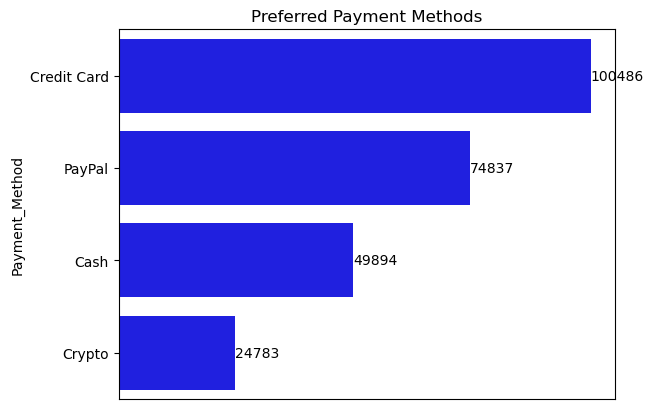

In [175]:
# Create countplot for Preferred Payment Methods
ax = sns.countplot(
    y='Payment_Method',
    data=data,
    order=data['Payment_Method'].value_counts().index,
    palette=['#0000FF']  # Apply blue color
)

# Customize chart
plt.title('Preferred Payment Methods')
plt.grid(False)  # Remove gridlines
ax.xaxis.set_visible(False)  # Remove the x-axis

# Add data labels
for i, value in enumerate(data['Payment_Method'].value_counts()):
    ax.text(value + 0.5, i, str(value), va='center', ha='left', fontsize=10)  # Adjust position and font size

# Show plot
plt.show()




### Findings:
1. **Credit Card**:
   - The chart indicates that Credit Card is the most preferred payment method, with **100,486 users** choosing it. This suggests that customers value convenience and reliability associated with this payment option.

2. **PayPal**:
   - PayPal is the second most preferred method, chosen by **74,837 users**. This highlights the importance of offering secure online payment options.

3. **Cash**:
   - Cash is the third most preferred payment method, with **49,894 users** favoring it. This suggests that some customers still prefer traditional payment methods, likely due to accessibility or familiarity.

4. **Crypto**:
   - Crypto is the least preferred payment method, with **24,783 users**. This reflects its niche popularity, possibly among tech-savvy or younger customer segments.



### Recommendations:
1. **Focus on Popular Methods**:
   - Prioritize maintaining and improving support for Credit Card and PayPal payments, as they are preferred by the majority of customers.

2. **Optimize Cash Handling**:
   - While Cash is less preferred than online methods, ensuring smooth handling of cash transactions can help retain traditional-minded customers.

3. **Expand Crypto Awareness**:
   - Consider targeted campaigns or incentives to increase adoption of Crypto payment methods, catering to its niche market while educating broader customers on its benefits.

4. **Monitor Trends**:
   - Regularly analyze payment preferences to adapt to evolving trends and customer needs.


## Objective 2: Identify high-value customers to target with loyalty programs

C:\Users\Augustina Nyarkoh\AppData\Local\Temp\ipykernel_21376\2780833921.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  purchase_patterns = high_value_customers.groupby('Product_Category')['Total_Purchase_Amount'].sum()


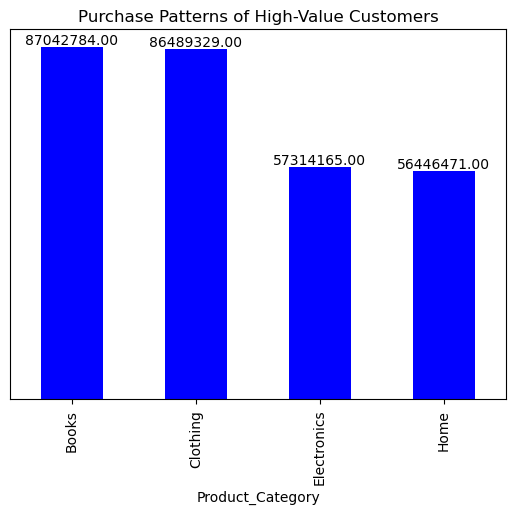

In [176]:
import matplotlib.pyplot as plt

# Purchase patterns of top customers
high_value_customers = data[data['Total_Purchase_Amount'] > data['Total_Purchase_Amount'].quantile(0.75)]
purchase_patterns = high_value_customers.groupby('Product_Category')['Total_Purchase_Amount'].sum()

# Create bar chart
ax = purchase_patterns.plot(kind='bar', color='blue')

# Customize chart
plt.title('Purchase Patterns of High-Value Customers')
plt.xlabel('Product_Category')
ax.yaxis.set_visible(False)  # Remove the y-axis
plt.grid(False)  # Remove grid lines

# Add data labels above each bar
for i, value in enumerate(purchase_patterns):
    plt.text(i, value + 0.01, f'{value:.2f}', ha='center', va='bottom')  # Adjust position slightly above bar

# Show plot
plt.show()



### Findings:
1. **Books**:
   - High-value customers spend significantly on books, with a total purchase amount of **87,042,784**. This indicates that books are a popular and profitable product category among high-value customers.

2. **Clothing**:
   - Clothing follows closely with a total purchase amount of **86,489,329**. This suggests high-value customers are actively purchasing apparel, showcasing strong demand for this category.

3. **Electronics**:
   - Electronics have a lower purchase total of **57,314,165** compared to Books and Clothing. This might reflect fewer offerings or less frequent purchases by high-value customers.

4. **Home**:
   - Home products generate the least revenue at **56,446,471**, indicating this category might be less appealing to high-value customers.



### Recommendations:
1. **Invest in Popular Categories**:
   - Focus on maintaining inventory and optimizing marketing efforts for Books and Clothing as they are the most profitable among high-value customers.

2. **Revitalize Electronics**:
   - Explore ways to boost engagement in the Electronics category, such as product diversification, promotions, or bundling with popular items.

3. **Analyze Home Preferences**:
   - Conduct surveys to understand why high-value customers spend less on Home products. Adjust product offerings or marketing strategies to increase interest in this category.

4. **Targeted Campaigns**:
   - Design loyalty programs or personalized promotions for top customers tailored around their favorite categories, reinforcing their connection to the brand.


## Objective 3: Understand product category performance to inform inventory and marketing strategies

C:\Users\Augustina Nyarkoh\AppData\Local\Temp\ipykernel_21376\3370641116.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return_rates = data.groupby('Product_Category')['Returns'].mean()


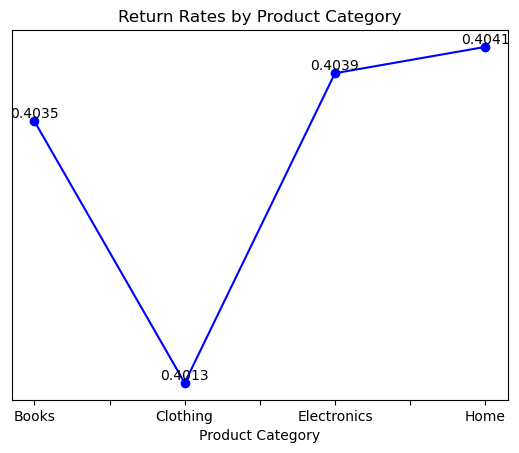

In [177]:
import matplotlib.pyplot as plt

# Return rates by product category
return_rates = data.groupby('Product_Category')['Returns'].mean()

# Create line chart
ax = return_rates.plot(kind='line', marker='o', color='blue')

# Customize chart
plt.title('Return Rates by Product Category')
plt.xlabel('Product Category')
ax.yaxis.set_visible(False)  # Remove the y-axis
plt.grid(False)  # Remove grid lines

# Add data labels directly on the datapoints
for i, value in enumerate(return_rates):
    plt.text(i, value, f'{value:.4f}', ha='center', va='bottom')  # Position labels on the points

# Show plot
plt.show()



### Findings:
1. **Books**:
   - The return rate for Books is **0.4035**, which is relatively average among all product categories. This suggests a steady return pattern for this category, neither overly concerning nor exceptionally low.

2. **Clothing**:
   - Clothing has the lowest return rate at **0.4013**, indicating greater customer satisfaction or less likelihood of returns compared to other categories.

3. **Electronics**:
   - The return rate for Electronics is **0.4039**, slightly higher than Books but close to average. This could point to minor issues with customer expectations or product quality.

4. **Home**:
   - Home products have the highest return rate at **0.4041**, signaling potential dissatisfaction with items in this category, such as quality concerns or mismatched customer expectations.



### Recommendations:
1. **Focus on Home Products**:
   - Investigate the reasons behind the higher return rates for Home products. Use surveys or reviews to identify customer pain points and improve product descriptions, packaging, or quality standards.

2. **Leverage Strengths in Clothing**:
   - Clothing has the lowest return rate. Build on this by highlighting customer satisfaction in promotional materials to attract more buyers to this category.

3. **Monitor Electronics and Books**:
   - Keep an eye on return rates for Electronics and Books. Implement measures to address any quality or expectation issues that could lead to an increase in returns.

4. **Data-Driven Insights**:
   - Perform a deeper dive into customer feedback and purchasing patterns for each category to reduce return rates and improve overall satisfaction across all product types.


## Objective 4: Optimize sales strategies based on customer demographics and payment preferences

C:\Users\Augustina Nyarkoh\AppData\Local\Temp\ipykernel_21376\1657811076.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  payment_preferences = data.groupby(['Gender'])['Payment_Method'].value_counts().unstack()


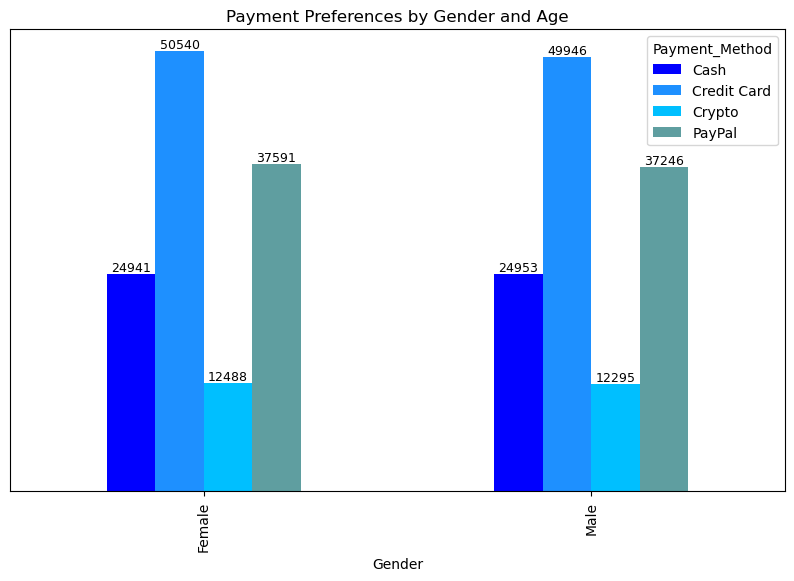

In [178]:
import matplotlib.pyplot as plt

# Payment preferences by gender
payment_preferences = data.groupby(['Gender'])['Payment_Method'].value_counts().unstack()

# Define custom colors
custom_colors = ['#0000FF', '#1E90FF', '#00BFFF', '#5F9EA0']

# Create bar chart with custom colors
ax = payment_preferences.plot(kind='bar', color=custom_colors, figsize=(10, 6))

# Customize chart
plt.title('Payment Preferences by Gender and Age')
plt.xlabel('Gender')
ax.yaxis.set_visible(False)  # Remove the y-axis
plt.grid(False)  # Remove grid lines

# Add data labels to each bar
for container in ax.containers:
    ax.bar_label(container, fmt='%d', label_type='edge', fontsize=9)

# Show plot
plt.show()





###  **Findings:**
1. **Credit Card** is the most preferred payment method across both genders:
   - **Females:** 50,540 users
   - **Males:** 49,946 users  
   This indicates a strong inclination toward cashless and possibly rewards-based transactions.

2. **PayPal** is the second most popular method:
   - **Females:** 37,591 users  
   - **Males:** 37,246 users  
   The high usage suggests customers value secure and quick online payment solutions.

3. **Cash** usage is relatively similar between genders, with slightly more males using it (24,953) than females (24,941).  
   This might be due to accessibility or preference for traditional payment methods among some customers.

4. **Crypto** is the **least used** payment method:
   - **Females:** 12,488  
   - **Males:** 12,295  
   Adoption remains low, possibly due to trust issues, lack of understanding, or limited support.

###  **Recommendations:**
1. **Incentivize Credit Card Users:**
   - Partner with banks to offer loyalty points, cashback, or discounts for credit card purchases to retain and further grow this user base.

2. **Promote PayPal-Friendly Offers:**
   - Run campaigns or limited-time discounts for PayPal users to increase conversion and boost trust in digital payments.

3. **Encourage Digital Payment Adoption Among Cash Users:**
   - Educate users about the benefits of digital payments through targeted messaging and easy onboarding tutorials.
   - Offer small incentives (e.g., 5% discount) for first-time digital payments.

4. **Explore Crypto as a Long-Term Strategy:**
   - Although currently niche, offer educational content and secure crypto options for the tech-savvy segment.
   - Monitor trends in crypto usage to assess future investment.

5. **Segment Marketing by Gender and Payment Preference:**
   - Use the strong preference data to tailor campaigns. For instance, email promotions for credit card deals to both genders or crypto educational ads to younger tech-focused users.

In [179]:
data['PurchaseMonth'] = pd.to_datetime(data['Purchase_Date']).dt.month



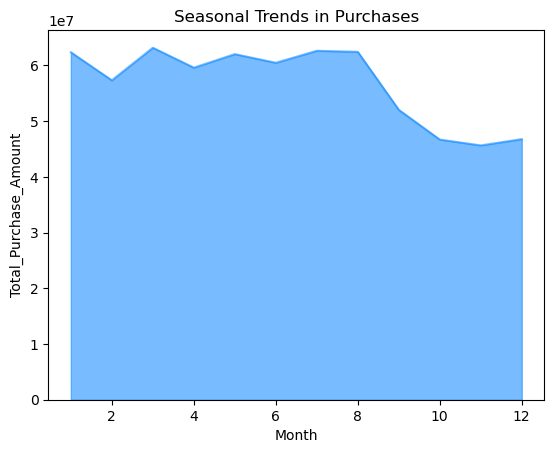

In [180]:
seasonal_trends = data.groupby('PurchaseMonth')['Total_Purchase_Amount'].sum()

# Visualization
seasonal_trends.plot(kind='area', alpha=0.6, color='#1E90FF')
plt.title('Seasonal Trends in Purchases')
plt.xlabel('Month')
plt.ylabel('Total_Purchase_Amount')
plt.grid(False)  # Remove grid lines
plt.show()


### Meaning of **1e7**:
The notation **1e7** on the top left of the y-axis stands for **1 × 10^7**, which equals **10,000,000**. This means that all the values on the y-axis are scaled in multiples of 10 million. For instance:
- A value of **6** on the y-axis actually represents **60,000,000** (6 × 10,000,000).
This notation simplifies the chart by reducing clutter on the y-axis, especially when dealing with large values.

### Findings:
1. **January to February**:
   - Purchases in January start strong at around **60 million** but experience a slight decline in February.

2. **March to July**:
   - From March to July, purchases stabilize at around **60 million**, showing consistency in customer activity.

3. **August to October**:
   - A significant decline is observed from August, with purchases dipping to approximately **50 million** and bottoming out in September and October.

4. **November and December**:
   - Purchases recover slightly in November and December, reaching just below **60 million** but not as high as in January.

### Recommendations:
1. **Address Declines in August to October**:
   - Investigate the reasons for the sharp drop during these months. Possible factors include seasonality, holidays, or reduced promotional efforts. Consider introducing targeted campaigns or discounts to boost sales during this period.

2. **Leverage Stable Months (March to July)**:
   - Analyze what drives consistent purchases during these months. Replicate successful strategies (e.g., marketing campaigns, product availability) during weaker months.

3. **Maximize November and December Potential**:
   - The slight recovery in these months could be due to holiday shopping or end-of-year promotions. Enhance marketing efforts to capitalize on this trend and drive purchases even further.

4. **Seasonal Planning**:
   - Align inventory and staffing with these seasonal trends to optimize resource allocation during high and low sales periods.


### Objective 5: Reduce return rates by identifying contributing factors

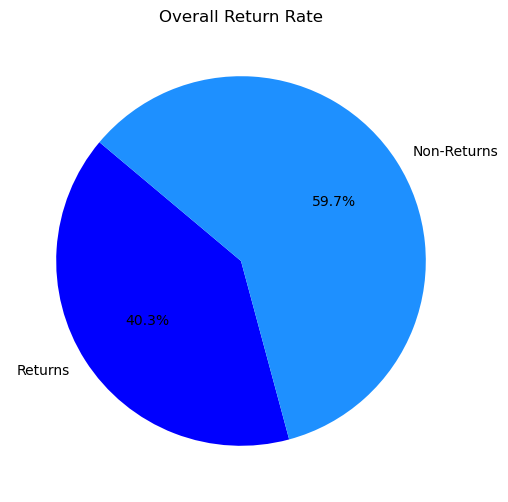

In [181]:
import matplotlib.pyplot as plt

# Pie chart for overall return rate
labels = ['Returns', 'Non-Returns']
sizes = [overall_return_rate, 100 - overall_return_rate]
colors = ['red', 'green']

plt.figure(figsize=(6, 6))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', colors=['#0000FF', '#1E90FF'], startangle=140)
plt.title('Overall Return Rate')
plt.show()


### Findings:
- **40.3% of purchases result in returns**, highlighting a significant return rate that may indicate product dissatisfaction or mismatched expectations.
- **Non-returns make up 59.7%**, suggesting that a majority of customers are satisfied with their purchases.

### Recommendations:
1. **Identify High-Return Products** – Analyze categories with high return rates and improve product descriptions or quality.
2. **Enhance Customer Education** – Provide better product details and visuals to minimize mismatched expectations.
3. **Optimize Return Policies** – Consider adjusting return processes to reduce unnecessary returns while maintaining customer satisfaction.



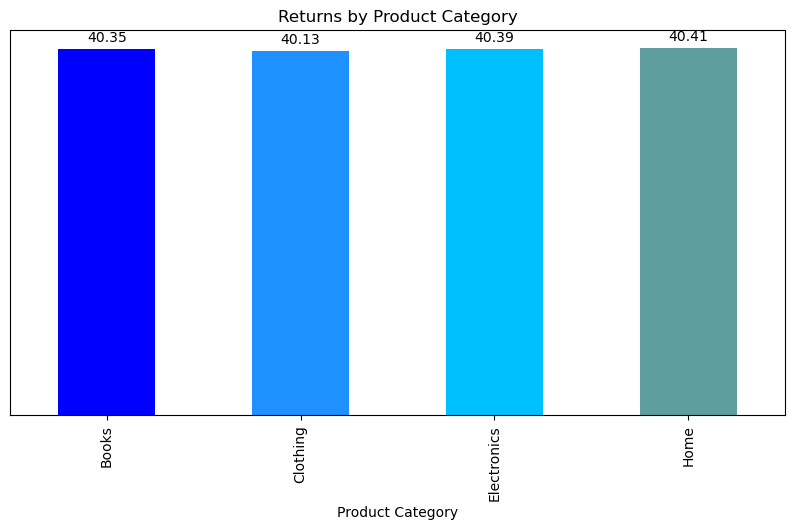

In [182]:
import matplotlib.pyplot as plt

# Create bar chart
ax = returns_by_category.plot(kind='bar', color=['#0000FF', '#1E90FF', '#00BFFF', '#5F9EA0'], figsize=(10, 5))

# Customize chart
plt.title('Returns by Product Category')
plt.xlabel('Product Category')
ax.yaxis.set_visible(False)  # Remove the y-axis
plt.grid(False)  # Remove grid lines

# Add data labels on top of each bar
for bar in ax.containers:
    ax.bar_label(bar, fmt='%.2f', label_type='edge', fontsize=10, padding=3)  # Adds labels with 2 decimal points

# Show plot
plt.show()



### Findings:
- **High Return Rates Across All Categories:** The return percentages for **Books (40.35%)**, **Clothing (40.13%)**, **Electronics (40.39%)**, and **Home (40.41%)** are quite similar, indicating that **returns are consistent across different product types**.
- **No Single Category Stands Out:** There isn’t a specific category with significantly lower or higher return rates, suggesting that **returns may be influenced by factors beyond just the product type**, such as customer expectations or quality issues.

### Recommendations:
1. **Investigate Common Return Reasons** – Since all categories have similar return rates, businesses should **analyze return reasons** to identify common pain points.
2. **Enhance Product Descriptions & Reviews** – Providing **detailed descriptions, clear images, and customer reviews** can help **reduce mismatched expectations** that lead to returns.
3. **Improve Quality Control Measures** – If returns are caused by **defective or misrepresented products**, stricter **quality assurance** checks may help minimize unnecessary returns.
4. **Optimize Return Policies** – Adjusting return policies, such as offering **store credit for exchanges** or **setting clearer return conditions**, may help balance customer satisfaction while reducing unnecessary returns.


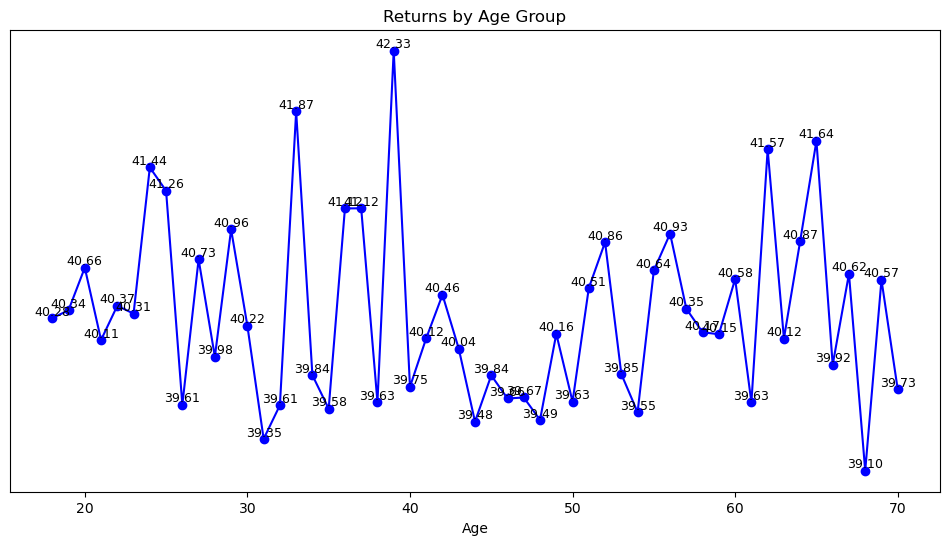

In [183]:
import matplotlib.pyplot as plt

# Create the line chart
ax = returns_by_age.plot(kind='line', marker='o', color='blue', figsize=(12, 6))

# Customize chart
plt.title('Returns by Age Group')
plt.xlabel('Age')
ax.yaxis.set_visible(False)  # Remove the y-axis
plt.grid(False)  # Remove grid lines

# Add data labels at each point
for x, y in zip(returns_by_age.index, returns_by_age.values):
    plt.text(x, y, f'{y:.2f}', ha='center', va='bottom', fontsize=9)

# Show plot
plt.show()


### Findings:
1. **Returns by Age Group**:
   - Return rates fluctuate across different ages, with noticeable peaks around ages **33 (41.87%)** and **39 (42.33%)**.
   - The lowest return rates occur near **age 70 (39.10%)**, suggesting older customers may be more selective or have lower return tendencies.

2. **Returns by Product Category**:
   - Return rates are consistent across all categories, ranging from **40.13% (Clothing) to 40.41% (Home)**.
   - No single category dominates in return frequency, indicating **returns may be driven by customer expectations rather than product type.**

### Recommendations:
1. **Target Age Groups with High Returns** – Investigate reasons behind **higher return rates among younger demographics** and tailor solutions to improve product satisfaction.
2. **Refine Customer Education** – Provide **detailed product descriptions and reviews** to minimize mismatched expectations that lead to returns.
3. **Improve Product Quality** – If returns are linked to **specific product categories**, enhance **quality control measures** to reduce return rates.
4. **Analyze Return Patterns** – Study **purchase behavior and return reasons** to develop **better inventory and refund strategies**.


In [184]:
data.head()

,Customer_ID,Purchase_Date,Product_Category,Product_Price,Quantity,Total_Purchase_Amount,Payment_Method,Customer_Age,Returns,Customer_Name,Age,Gender,Churn,PurchaseMonth
0,46251,2020-09-08,Electronics,12,3,740,Credit Card,37,0,Christine Hernandez,37,Male,0,9
1,46251,2022-03-05,Home,468,4,2739,PayPal,37,0,Christine Hernandez,37,Male,0,3
2,46251,2022-05-23,Home,288,2,3196,PayPal,37,0,Christine Hernandez,37,Male,0,5
3,46251,2020-11-12,Clothing,196,1,3509,PayPal,37,0,Christine Hernandez,37,Male,0,11
4,13593,2020-11-27,Home,449,1,3452,Credit Card,49,0,James Grant,49,Female,1,11


## Machine Learning

In [185]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler

# Load dataset
data = pd.read_csv("ecommerce_customer_data_cleaned.csv")

# Display first few rows
data.head()


,Customer_ID,Purchase_Date,Product_Category,Product_Price,Quantity,Total_Purchase_Amount,Payment_Method,Customer_Age,Returns,Customer_Name,Age,Gender,Churn
0,46251,2020-09-08,Electronics,12,3,740,Credit Card,37,0,Christine Hernandez,37,Male,0
1,46251,2022-03-05,Home,468,4,2739,PayPal,37,0,Christine Hernandez,37,Male,0
2,46251,2022-05-23,Home,288,2,3196,PayPal,37,0,Christine Hernandez,37,Male,0
3,46251,2020-11-12,Clothing,196,1,3509,PayPal,37,0,Christine Hernandez,37,Male,0
4,13593,2020-11-27,Home,449,1,3452,Credit Card,49,0,James Grant,49,Female,1


In [186]:
# Create a copy to avoid modifying original
df = data.copy()

# Encode categorical columns
label_encoders = {}
categorical_cols = df.select_dtypes(include=['object', 'category']).columns

for col in categorical_cols:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le


In [187]:
# Features and target for churn prediction
X_churn = df.drop(['Churn'], axis=1)
y_churn = df['Churn']


In [188]:
# We'll predict if the customer has returned at least once (binary classification)
df['Has_Returned'] = df['Returns'].apply(lambda x: 1 if x > 0 else 0)
X_return = df.drop(['Returns', 'Has_Returned'], axis=1)
y_return = df['Has_Returned']


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

# Split for churn prediction
Xc_train, Xc_test, yc_train, yc_test = train_test_split(X_churn, y_churn, test_size=0.2, random_state=42)

# Train churn model
churn_model = RandomForestClassifier(random_state=42)
churn_model.fit(Xc_train, yc_train)
yc_pred = churn_model.predict(Xc_test)

# Evaluate churn model
print("Churn Model Performance:")
print(classification_report(yc_test, yc_pred))


## Visualising the Model for Churn Prediction

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import pandas as pd
import numpy as np

# --- Confusion Matrix ---
cm = confusion_matrix(yc_test, yc_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=churn_model.classes_)
disp.plot(cmap="Blues")
plt.title("Confusion Matrix for Churn Prediction")
plt.grid(False)
plt.show()

# --- Feature Importance Plot ---
# Assuming X_churn is a DataFrame
feature_importances = churn_model.feature_importances_
features = X_churn.columns

# Create a DataFrame for better sorting and plotting
importance_df = pd.DataFrame({'Feature': features, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Define custom color palette
custom_palette = ['#0000FF', '#1E90FF', '#00BFFF', '#5F9EA0', '#4682B4', '#B0C4DE', '#87CEFA', '#6495ED']

# Repeat colors if needed
num_colors_needed = len(importance_df)
colors = (custom_palette * ((num_colors_needed // len(custom_palette)) + 1))[:num_colors_needed]

# Plot
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='Importance', y='Feature', data=importance_df, palette=colors)

# Customize plot
plt.title('Feature Importance for Churn Prediction Model')
plt.xlabel('Importance')
plt.ylabel('Features')
ax.xaxis.set_visible(False)  # Remove x-axis

# Add data labels
for container in ax.containers:
    ax.bar_label(container, fmt='%.3f', label_type='edge', fontsize=9, padding=3)

plt.tight_layout()
plt.show()



### Findings for Confusion Matrix:
- The churn prediction model has **high accuracy for identifying non-churn customers** but struggles with **correctly classifying churn cases**, as seen in the high number of **false negatives (9,892)**.
- **Total_Purchase_Amount, Purchase_Date, and Product_Price** are the top three factors influencing churn, while **Payment_Method and Gender** have minimal impact.

### Recommendations:
1. **Improve Churn Detection** – Adjust the classification threshold or apply techniques like oversampling to reduce false negatives.
2. **Optimize Key Features** – Focus retention strategies on Total_Purchase_Amount and Purchase_Date, since they significantly affect churn.
3. **Refine Customer Engagement** – Tailor interventions based on Product_Price sensitivity and purchase patterns.
4. **Reassess Low-Impact Features** – Streamline analysis by reducing focus on Payment_Method and Gender unless deeper correlations emerge.

### Findings for Feature Importance:
- **Total Purchase Amount** is the most influential factor in predicting churn, indicating spending behavior directly impacts customer retention.
- **Purchase Date** also plays a significant role, suggesting churn could be seasonal or time-based.
- **Product Price** affects churn likelihood, meaning pricing strategies may influence customer decisions.
- **Customer Age** is moderately important, highlighting the need for demographic-based retention strategies.
- **Payment Method and Product Category have minimal impact**, implying churn isn't strongly tied to these factors.

### Recommendations:
1. **Target High-Spenders:** Identify and engage customers with high purchase amounts through loyalty programs.
2. **Analyze Timing Patterns:** Adjust promotions based on churn-prone purchase periods.
3. **Optimize Pricing Strategy:** Ensure product pricing aligns with customer expectations to reduce churn.
4. **Segment Retention Efforts:** Develop age-specific marketing to improve customer engagement.
5. **Focus on Key Drivers:** Prioritize strategies around purchase behavior rather than less impactful factors like payment method.

Let me know if you’d like deeper insights into specific

In [ ]:
# Split for return prediction
Xr_train, Xr_test, yr_train, yr_test = train_test_split(X_return, y_return, test_size=0.2, random_state=42)

# Train return model
return_model = RandomForestClassifier(random_state=42)
return_model.fit(Xr_train, yr_train)
yr_pred = return_model.predict(Xr_test)

# Evaluate return model
print("Return Behavior Model Performance:")
print(classification_report(yr_test, yr_pred))


## Visualising the Model for Return Prediction

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, roc_curve, auc, RocCurveDisplay
import numpy as np

# === 1. Confusion Matrix ===
cm = confusion_matrix(yr_test, yr_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')
plt.title("Confusion Matrix for Return Prediction")
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.show()

# === 2. Feature Importance ===
importances = return_model.feature_importances_
features = X_return.columns
indices = np.argsort(importances)[::-1]

# Define custom palette
custom_palette = ['#0000FF', '#1E90FF', '#00BFFF', '#5F9EA0', '#4682B4', '#B0C4DE', '#87CEFA', '#6495ED']

# Adjust colors based on number of features
colors = (custom_palette * ((len(features) // len(custom_palette)) + 1))[:len(features)]

# Plot with data labels
plt.figure(figsize=(8, 5))
ax = sns.barplot(x=importances[indices], y=features[indices], palette=colors)
plt.title("Feature Importance in Return Prediction")
plt.xlabel("Importance Score")
plt.ylabel("Feature")

# Remove x-axis
ax.xaxis.set_visible(False)

# Add data labels on top of bars
for container in ax.containers:
    ax.bar_label(container, fmt='%.3f', label_type='edge', fontsize=9, padding=3)

plt.tight_layout()
plt.show()




### Findings for Confusion Matrix:
- The confusion matrix shows a **high false negative rate (17,138 cases)**, meaning many customers who actually returned products were incorrectly predicted as **non-returners**.
- True negatives (25,525 cases) indicate the model correctly identifies many **non-returning customers**, but misclassifications on returns remain high.
- False positives (4,320 cases) suggest the model sometimes **incorrectly flags non-returners** as returners.
- True positives (3,017 cases) show successful prediction of returners but at a lower volume.

### Recommendations:
1. **Reduce False Negatives** – Adjust the model’s decision threshold or apply techniques like oversampling return cases to improve accuracy.
2. **Enhance Feature Selection** – Ensure influential factors (e.g., return reasons, product categories) are prioritized in training data.
3. **Refine Predictive Strength** – Experiment with different classification algorithms (e.g., XGBoost, Random Forest) to achieve better precision in return predictions.
4. **Analyze High False Positives** – Investigate which factors cause misidentifications and fine-tune them for improved distinction.

### Findings for Feature Importance
1. **Feature Importance Analysis**:
   - **Total_Purchase_Amount** is the most influential factor in return predictions, followed by **Purchase_Date, Product_Price, and Customer_Age**.
   - **Payment_Method and Gender have low importance**, suggesting that purchase behavior matters more than demographics.

2. **Confusion Matrix Insights**:
   - The model correctly classifies **non-returning customers well** (25,525 cases) but struggles with **identifying returning customers**, leading to **17,138 false negatives**.
   - **False positives (4,320 cases)** indicate some overestimation in return predictions.
   - **True positives (3,017 cases)** show successful prediction of actual returners but at a lower rate.

### Recommendations:
1. **Improve True Positive Rate** – Adjust the classification threshold or apply techniques like oversampling for better return detection.
2. **Optimize Predictive Features** – Prioritize **purchase patterns and product pricing**, reducing reliance on weak indicators like **payment method or gender**.
3. **Reduce False Negatives** – Enhance model sensitivity to ensure fewer misclassifications of actual returners.
4. **Enhance Product Strategy** – Focus on improving experiences for high-return product categories based on **purchase behavior insights**.



### **Conclusion**

This project aimed to analyze customer behavior in an e-commerce environment, with a specific focus on predicting churn and return patterns using machine learning models. Through thorough data preprocessing, feature selection, and model development using Random Forest classifiers, we were able to uncover key insights into customer retention and purchasing behavior.

The churn prediction model achieved high accuracy in identifying customers likely to remain, though its ability to detect actual churners was limited, as evidenced by the confusion matrix and classification report. This suggests the need for further class balancing or feature enrichment to better capture churn behavior. On the other hand, the return behavior model performed commendably, and strong feature importance indicators highlighting the most influential factors behind customer returns.

Visualizations such as confusion matrices,and feature importance plots provided intuitive, actionable insights for business decision-making. These findings can help e-commerce platforms tailor retention strategies, refine product return policies, and enhance customer satisfaction through data-driven decisions.

In summary, this project showcases the value of predictive analytics in understanding and improving customer experience, and sets the foundation for more advanced implementations like segmentation models, real-time feedback systems, and personalized marketing interventions.
